<a href="https://colab.research.google.com/github/siddmohanty111/PlaylistClustering/blob/main/Math250_Spotify_Extended_Clustering_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Math 250 Spotify — Title vs Track Embeddings: Dimensionality Reduction, Clustering, and Validation

This notebook integrates the existing other work with the current t-SNE/PCA workflow, while avoiding unnecessary reruns.

Main goals:

1. Pull the repos into Google Drive so updates persist across Colab sessions.
2. Reuse existing Drive artifacts whenever possible, especially existing embedding `.pkl` files and fuzzy cluster probability outputs.
3. Create report-ready PCA and t-SNE visualizations comparing playlist title embeddings against mean-pooled/song/track embeddings.
4. Extend the fuzzy clustering analysis with probability-distribution clustering, abbreviated below as **PD clustering**.
5. Validate cluster quality with shareable tables and figures.
6. Compare two workflows with ARI:
   - **Cluster first, then dimension reduce**
   - **Dimension reduce first, then cluster**

> Important: shared folders usually need to be added as shortcuts to `MyDrive` before Colab can see them by path. If a path below is not found, add a shortcut to the shared folder or manually edit the path variables in the configuration cell.

In [1]:
# Colab setup: mount Drive and install only the minimal extra package needed for fuzzy clustering.
# This avoids rerunning the expensive first-time setup / embedding generation scripts.

from google.colab import drive
drive.mount('/content/drive')

%pip -q install scikit-fuzzy joblib

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1. Configuration

Edit this cell if shared folders have different names. The notebook searches several likely paths automatically.

In [2]:
import os
import sys
import json
import math
import pickle
import random
import subprocess
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import display

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import (
    adjusted_rand_score,
    adjusted_mutual_info_score,
    normalized_mutual_info_score,
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
)
from scipy.stats import entropy

warnings.filterwarnings("ignore", category=FutureWarning)

# -----------------------------
# Main project location in Drive
# -----------------------------
DRIVE_PROJECT_ROOT = "/content/drive/MyDrive/Math 250 Project - Spotify"

# If your files are still in another Drive shortcut, keep these path candidates.
ALT_ROOTS = [
    DRIVE_PROJECT_ROOT,
    "/content/drive/MyDrive/S2026/Spotify Playlist Data",
    "/content/drive/MyDrive/Spotify Playlist Data",
]

# Repos will be cloned/pulled here so the code persists in Drive.
REPOS_DIR = os.path.join(DRIVE_PROJECT_ROOT, "repos")
RECSYS_REPO_URL = "https://github.com/siddmohanty111/RecsysUpgrade.git"
PLAYLIST_REPO_URL = "https://github.com/siddmohanty111/PlaylistClustering.git"
RECSYS_REPO_DIR = os.path.join(REPOS_DIR, "RecsysUpgrade")
PLAYLIST_REPO_DIR = os.path.join(REPOS_DIR, "PlaylistClustering")

# Output and cache locations.
ANALYSIS_DIR = os.path.join(DRIVE_PROJECT_ROOT, "analysis_outputs", "title_track_cluster_extension")
FIG_DIR = os.path.join(ANALYSIS_DIR, "figures")
TABLE_DIR = os.path.join(ANALYSIS_DIR, "tables")
CACHE_DIR = os.path.join(ANALYSIS_DIR, "cache")

for d in [DRIVE_PROJECT_ROOT, REPOS_DIR, ANALYSIS_DIR, FIG_DIR, TABLE_DIR, CACHE_DIR]:
    os.makedirs(d, exist_ok=True)

# Main notebook controls.
RANDOM_SEED = 42
SAMPLE_SIZE = 20_000          # t-SNE and most comparisons use this sample.
VALIDATION_SAMPLE_SIZE = 5_000
MAIN_K = 50                   # Matches teammate fuzzy clustering setup.
K_CANDIDATES = list(range(10, 81, 10))
TSNE_PERPLEXITY = 30
PCA_PRECOMPONENTS = 50

# Prevent accidental expensive recomputation.
FORCE_RECOMPUTE = False
RUN_FUZZY_IF_MISSING = False  # Full fuzzy c-means on 1M rows is expensive. Keep False unless intentionally rerunning.

print("Analysis directory:", ANALYSIS_DIR)
print("Figures:", FIG_DIR)
print("Tables:", TABLE_DIR)
print("Cache:", CACHE_DIR)

Analysis directory: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension
Figures: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/figures
Tables: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/tables
Cache: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/cache


## 2. Git pull / clone into Google Drive

This fixes the earlier issue where `git pull` was run outside a git repo. The helper below clones once, then uses `git -C <repo> pull --ff-only` in later runs.

In [3]:
def run_cmd(cmd, cwd=None, check=True):
    print("$", " ".join(cmd))
    result = subprocess.run(cmd, cwd=cwd, text=True, capture_output=True)
    if result.stdout:
        print(result.stdout.strip())
    if result.stderr:
        print(result.stderr.strip())
    if check and result.returncode != 0:
        raise RuntimeError(f"Command failed with code {result.returncode}: {' '.join(cmd)}")
    return result


def clone_or_pull(repo_url, target_dir, branch="main"):
    target = Path(target_dir)
    git_dir = target / ".git"

    if git_dir.exists():
        print(f"Repo exists. Pulling latest changes: {target_dir}")
        run_cmd(["git", "-C", str(target), "pull", "--ff-only"])
    elif target.exists() and any(target.iterdir()):
        raise RuntimeError(
            f"Target exists but is not a git repo: {target_dir}\n"
            "Rename/delete it, or set a different REPOS_DIR."
        )
    else:
        print(f"Cloning {repo_url} into {target_dir}")
        os.makedirs(target.parent, exist_ok=True)
        run_cmd(["git", "clone", repo_url, str(target)])

    run_cmd(["git", "-C", str(target), "status", "--short"], check=False)
    return str(target)

RECSYS_REPO_DIR = clone_or_pull(RECSYS_REPO_URL, RECSYS_REPO_DIR)
PLAYLIST_REPO_DIR = clone_or_pull(PLAYLIST_REPO_URL, PLAYLIST_REPO_DIR)

# Make local repo imports possible.
for repo_dir in [RECSYS_REPO_DIR, PLAYLIST_REPO_DIR]:
    if repo_dir not in sys.path:
        sys.path.append(repo_dir)

print("Repos ready.")

Repo exists. Pulling latest changes: /content/drive/MyDrive/Math 250 Project - Spotify/repos/RecsysUpgrade
$ git -C /content/drive/MyDrive/Math 250 Project - Spotify/repos/RecsysUpgrade pull --ff-only
Already up to date.
$ git -C /content/drive/MyDrive/Math 250 Project - Spotify/repos/RecsysUpgrade status --short
Repo exists. Pulling latest changes: /content/drive/MyDrive/Math 250 Project - Spotify/repos/PlaylistClustering
$ git -C /content/drive/MyDrive/Math 250 Project - Spotify/repos/PlaylistClustering pull --ff-only
Already up to date.
$ git -C /content/drive/MyDrive/Math 250 Project - Spotify/repos/PlaylistClustering status --short
Repos ready.


## 3. Locate existing embeddings and fuzzy-clustering outputs

The preferred input is your teammate's newer `embeddings.pkl` DataFrame with columns:

`playlist_title`, `title_embedding`, `playlist_tracks`, `tracks_embedding`

The notebook will also try other known paths from the previous notebooks.

In [4]:
# -----------------------------
# Locate existing teammate fuzzy cluster outputs
# -----------------------------
from pathlib import Path
import os

FUZZY_TITLE_FILENAME = "fkmeans_title_clusters.pkl"
FUZZY_TRACKS_FILENAME = "fkmeans_tracks_clusters.pkl"

# Add exact likely locations here.
FUZZY_CLUSTER_DIR_CANDIDATES = [
    # If you added "Spotify Playlist Data" shortcut directly to MyDrive
    "/content/drive/MyDrive/Spotify Playlist Data/Track vs Title/new clusters",

    # If the shared folder is inside the Math 250 project folder
    "/content/drive/MyDrive/Math 250 Project - Spotify/Spotify Playlist Data/Track vs Title/new clusters",
    "/content/drive/MyDrive/Math 250 Project - Spotify/Track vs Title/new clusters",

    # Teammate's older path
    "/content/drive/MyDrive/S2026/Spotify Playlist Data/Track vs Title/new clusters",

    # Your project output path, in case you copied them there
    "/content/drive/MyDrive/Math 250 Project - Spotify/new clusters",
]

def find_file_in_candidates(filename, candidate_dirs):
    for folder in candidate_dirs:
        path = os.path.join(folder, filename)
        if os.path.exists(path):
            return path

    return None

FUZZY_TITLE_PKL = find_file_in_candidates(
    FUZZY_TITLE_FILENAME,
    FUZZY_CLUSTER_DIR_CANDIDATES
)

FUZZY_TRACKS_PKL = find_file_in_candidates(
    FUZZY_TRACKS_FILENAME,
    FUZZY_CLUSTER_DIR_CANDIDATES
)

print("Fuzzy title clusters:", FUZZY_TITLE_PKL)
print("Fuzzy track clusters:", FUZZY_TRACKS_PKL)

if FUZZY_TITLE_PKL is None or FUZZY_TRACKS_PKL is None:
    print("\nCould not find one or both fuzzy cluster files.")
    print("Checked these folders:")
    for folder in FUZZY_CLUSTER_DIR_CANDIDATES:
        print(" -", folder)
else:
    print("\nFound both teammate fuzzy cluster files.")

FUZZY_TITLE_PKL = "/content/drive/MyDrive/Spotify Playlist Data/Track vs Title/new clusters/fkmeans_title_clusters.pkl"
FUZZY_TRACKS_PKL = "/content/drive/MyDrive/Spotify Playlist Data/Track vs Title/new clusters/fkmeans_tracks_clusters.pkl"

Fuzzy title clusters: /content/drive/MyDrive/Spotify Playlist Data/Track vs Title/new clusters/fkmeans_title_clusters.pkl
Fuzzy track clusters: /content/drive/MyDrive/Spotify Playlist Data/Track vs Title/new clusters/fkmeans_tracks_clusters.pkl

Found both teammate fuzzy cluster files.


## 4. Load and standardize the embedding data

This cell handles both the newer DataFrame format and older dictionary formats. For the title-vs-track comparison, both `title_embedding` and `tracks_embedding` are needed.

In [ ]:
# import subprocess
# import sys
# import os

# import subprocess, sys

# # Upgrade pandas to latest
# subprocess.check_call([sys.executable, "-m", "pip", "install", "--upgrade", "pandas", "-q"])

# # Restart runtime so the new pandas version is actually loaded
# import os
# os.kill(os.getpid(), 9)  # Forces a runtime restart — re-run all cells after this

In [5]:
from google.colab import drive
drive.mount("/content/drive")

import os
import pickle
import pandas as pd

DRIVE_PROJECT_ROOT = "/content/drive/MyDrive/Math 250 Project - Spotify"
EMBEDDINGS_PKL = os.path.join(DRIVE_PROJECT_ROOT, "embeddings.pkl")

print("Current pandas version:", pd.__version__)
print("Trying to load:", EMBEDDINGS_PKL)
print("File exists:", os.path.exists(EMBEDDINGS_PKL))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Current pandas version: 3.0.2
Trying to load: /content/drive/MyDrive/Math 250 Project - Spotify/embeddings.pkl
File exists: True


In [6]:
def load_pickle(path):
    with open(path, "rb") as f:
        return pickle.load(f)


def _mapping_or_sequence_to_series(obj, ids=None):
    if isinstance(obj, dict):
        if ids is None:
            keys = list(obj.keys())
            values = [obj[k] for k in keys]
            return keys, values
        return ids, [obj.get(k, None) for k in ids]
    values = list(obj)
    if ids is None:
        ids = list(range(len(values)))
    return ids, values


def standardize_embedding_object(obj):
    # Return a DataFrame with as many standard columns as possible.
    if isinstance(obj, pd.DataFrame):
        df = obj.copy()
    elif isinstance(obj, dict):
        # Newer dict-like DataFrame format.
        if {"playlist_title", "title_embedding", "playlist_tracks", "tracks_embedding"}.issubset(obj.keys()):
            df = pd.DataFrame(obj)
        # Older structured dictionary.
        elif "playlist_embeddings" in obj:
            ids, vals = _mapping_or_sequence_to_series(obj["playlist_embeddings"])
            df = pd.DataFrame({"pid": ids, "playlist_embedding": vals})
            if "playlist_titles" in obj:
                _, titles = _mapping_or_sequence_to_series(obj["playlist_titles"], ids=ids)
                df["playlist_title"] = titles
            if "playlist_tracks" in obj:
                _, tracks = _mapping_or_sequence_to_series(obj["playlist_tracks"], ids=ids)
                df["playlist_tracks"] = tracks
        # Plain pid -> embedding mapping.
        else:
            keys = list(obj.keys())
            vals = [obj[k] for k in keys]
            df = pd.DataFrame({"pid": keys, "tracks_embedding": vals})
    else:
        raise TypeError(f"Unsupported pickle object type: {type(obj)}")

    # Common aliases.
    aliases = {
        "playlist_titles": "playlist_title",
        "titles": "playlist_title",
        "tracks": "playlist_tracks",
        "track_embedding": "tracks_embedding",
        "song_embedding": "tracks_embedding",
        "songs_embedding": "tracks_embedding",
        "mean_pooled_embedding": "tracks_embedding",
        "mean_pool_embedding": "tracks_embedding",
    }
    for old, new in aliases.items():
        if old in df.columns and new not in df.columns:
            df = df.rename(columns={old: new})

    return df


def as_float_matrix_from_sample(df, col, sample_idx=None, normalize=True):
    if col not in df.columns:
        raise KeyError(f"Column not found: {col}")

    sub = df.iloc[sample_idx].copy() if sample_idx is not None else df.copy()
    vectors = []
    good_positions = []
    expected_dim = None

    for pos, value in zip(sub.index.to_numpy(), sub[col].values):
        try:
            arr = np.asarray(value, dtype=np.float32).reshape(-1)
        except Exception:
            continue
        if arr.size == 0 or not np.isfinite(arr).all():
            continue
        if expected_dim is None:
            expected_dim = arr.size
        if arr.size != expected_dim:
            continue
        vectors.append(arr)
        good_positions.append(pos)

    if not vectors:
        raise ValueError(f"No valid vectors found in column {col}")

    X = np.vstack(vectors).astype(np.float32)
    if normalize:
        norms = np.linalg.norm(X, axis=1, keepdims=True)
        X = X / np.maximum(norms, 1e-12)
    return X, np.asarray(good_positions)

raw_obj = load_pickle(EMBEDDINGS_PKL)
df = standardize_embedding_object(raw_obj).reset_index(drop=True)

# Optional cleanup for older files where a first row was known to be malformed.
DROP_FIRST_ROW_IF_GARBAGE = False
if DROP_FIRST_ROW_IF_GARBAGE:
    df = df.iloc[1:].reset_index(drop=True)

print("Loaded object type:", type(raw_obj))
print("DataFrame shape:", df.shape)
print("Columns:", df.columns.tolist())
display(df.head())

required_cols = ["title_embedding", "tracks_embedding"]
missing = [c for c in required_cols if c not in df.columns]
if missing:
    raise ValueError(
        f"Missing columns needed for title-vs-track comparison: {missing}\n"
        "Use the newer embeddings.pkl DataFrame with playlist_title, title_embedding, "
        "playlist_tracks, and tracks_embedding."
    )

Loaded object type: <class 'pandas.DataFrame'>
DataFrame shape: (1000000, 4)
Columns: ['playlist_title', 'title_embedding', 'playlist_tracks', 'tracks_embedding']


,playlist_title,title_embedding,playlist_tracks,tracks_embedding
0,throwbacks,"[0.011216642, 0.0033928207, 0.003417922, -0.01...","[Lose Control (feat. Ciara & Fat Man Scoop), T...","[-0.08528523, 0.038696438, 0.015848912, 0.0228..."
1,awesome playlist,"[-0.08927007, -0.09901914, -0.0293388, -0.0857...","[Eye of the Tiger, Libera Me From Hell (Tengen...","[-0.09267386, 0.04584772, -0.031244487, 0.0084..."
2,korean,"[-0.049768448, 0.05802605, 0.023397932, 0.0232...","[Like You, GOOD (feat. ELO), Inferiority Compl...","[-0.12570925, 0.059843346, 0.044394094, -0.007..."
3,mat,"[-0.023064643, 0.022735357, -0.058358226, 0.00...","[Danse macabre, Piano concerto No. 2 in G Mino...","[-0.07640698, 0.053276286, 0.037593663, 0.0362..."
4,90s,"[-0.047616515, 0.06071275, -0.033675063, -0.03...","[Tonight, Tonight, Wonderwall - Remastered, I ...","[-0.07728882, 0.026626725, 0.033332914, -0.007..."


## 5. Create a stable sample and load matrices

The same sampled playlist rows are used for titles and tracks so comparisons are aligned. The sample indices are cached in Drive.

In [7]:
rng = np.random.default_rng(RANDOM_SEED)

sample_idx_path = os.path.join(CACHE_DIR, f"sample_indices_n{SAMPLE_SIZE}_seed{RANDOM_SEED}.npy")
if os.path.exists(sample_idx_path) and not FORCE_RECOMPUTE:
    sample_idx = np.load(sample_idx_path)
    sample_idx = sample_idx[sample_idx < len(df)]
    print("Loaded cached sample indices:", sample_idx.shape)
else:
    n_sample = min(SAMPLE_SIZE, len(df))
    sample_idx = rng.choice(len(df), size=n_sample, replace=False)
    np.save(sample_idx_path, sample_idx)
    print("Created new sample indices:", sample_idx.shape)

# Stack title and track embeddings. If any sampled row is invalid for one side, keep only the intersection.
title_X_raw, title_good_idx = as_float_matrix_from_sample(df, "title_embedding", sample_idx=sample_idx, normalize=True)
track_X_raw, track_good_idx = as_float_matrix_from_sample(df, "tracks_embedding", sample_idx=sample_idx, normalize=True)

common_idx = np.intersect1d(title_good_idx, track_good_idx)
print("Common valid sampled rows:", len(common_idx))

# Restack on the exact same valid rows.
title_X, valid_idx = as_float_matrix_from_sample(df, "title_embedding", sample_idx=common_idx, normalize=True)
track_X, valid_idx_2 = as_float_matrix_from_sample(df, "tracks_embedding", sample_idx=common_idx, normalize=True)
assert np.array_equal(valid_idx, valid_idx_2)

sample_titles = df.iloc[valid_idx]["playlist_title"].values if "playlist_title" in df.columns else valid_idx.astype(str)

print("Title matrix:", title_X.shape)
print("Track matrix:", track_X.shape)
print("First few playlist titles:", sample_titles[:5])

Created new sample indices: (20000,)
Common valid sampled rows: 20000
Title matrix: (20000, 384)
Track matrix: (20000, 384)
First few playlist titles: <StringArray>
['throwbacks', 'aaa', 'chill', 'metal', 'sweat.it.out.']
Length: 5, dtype: str


## 6. Utility functions for caching, plotting, and tables

In [8]:
def cache_npz(path, compute_fn, force=False):
    if os.path.exists(path) and not force:
        print("Loading cached:", path)
        return dict(np.load(path, allow_pickle=True))
    print("Computing and caching:", path)
    result = compute_fn()
    np.savez_compressed(path, **result)
    return result


def save_json(obj, path):
    with open(path, "w") as f:
        json.dump(obj, f, indent=2)


def plot_report_scatter(coords, labels=None, title="", xlabel="Dimension 1", ylabel="Dimension 2", path=None, caption=None):
    fig, ax = plt.subplots(figsize=(10, 8), dpi=300)

    if labels is None:
        ax.scatter(coords[:, 0], coords[:, 1], s=8, alpha=0.65, linewidths=0, rasterized=True)
    else:
        scatter = ax.scatter(
            coords[:, 0], coords[:, 1], c=labels, cmap="turbo",
            s=8, alpha=0.75, linewidths=0, rasterized=True
        )
        cbar = plt.colorbar(scatter, ax=ax, pad=0.01)
        cbar.set_label("Cluster", fontsize=11)

    ax.set_title(title, fontsize=15, fontweight="bold", pad=12)
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.grid(True, alpha=0.25)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    if caption:
        fig.text(0.5, -0.02, caption, ha="center", fontsize=10, wrap=True)

    plt.tight_layout()
    if path:
        fig.savefig(path, dpi=300, bbox_inches="tight")
        print("Saved:", path)
    plt.show()


def plot_pair(coords_a, coords_b, labels_a=None, labels_b=None, method_name="PCA", path=None):
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=300)
    items = [
        (axes[0], coords_a, labels_a, f"Playlist Title Embeddings — {method_name}"),
        (axes[1], coords_b, labels_b, f"Mean-Pooled Track Embeddings — {method_name}"),
    ]
    for ax, coords, labels, title in items:
        if labels is None:
            ax.scatter(coords[:, 0], coords[:, 1], s=7, alpha=0.65, linewidths=0, rasterized=True)
        else:
            sc = ax.scatter(coords[:, 0], coords[:, 1], c=labels, cmap="turbo", s=7, alpha=0.75, linewidths=0, rasterized=True)
        ax.set_title(title, fontsize=13, fontweight="bold")
        ax.set_xlabel(f"{method_name} 1")
        ax.set_ylabel(f"{method_name} 2")
        ax.grid(True, alpha=0.25)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

    if labels_a is not None or labels_b is not None:
        fig.colorbar(sc, ax=axes.ravel().tolist(), shrink=0.8, pad=0.01, label="Cluster")

    fig.suptitle(f"Title vs Track Embedding Space Comparison using {method_name}", fontsize=16, fontweight="bold", y=1.02)
    plt.tight_layout()
    if path:
        fig.savefig(path, dpi=300, bbox_inches="tight")
        print("Saved:", path)
    plt.show()


def save_df_table_image(df_table, path, title="", max_rows=25):
    show_df = df_table.head(max_rows).copy()
    fig_h = max(2.5, 0.35 * len(show_df) + 1.5)
    fig, ax = plt.subplots(figsize=(12, fig_h), dpi=300)
    ax.axis("off")
    if title:
        ax.set_title(title, fontsize=14, fontweight="bold", pad=12)
    table = ax.table(
        cellText=show_df.values,
        colLabels=show_df.columns,
        loc="center",
        cellLoc="center",
    )
    table.auto_set_font_size(False)
    table.set_fontsize(8)
    table.scale(1, 1.2)
    fig.tight_layout()
    fig.savefig(path, dpi=300, bbox_inches="tight")
    print("Saved:", path)
    plt.show()

## 7. PCA and t-SNE dimensionality reduction

PCA results and t-SNE results are cached. t-SNE is the expensive step, so it will only rerun if `FORCE_RECOMPUTE = True` or if the cache is missing.

In [9]:
def compute_pca_cached(X, name, n_components_50=PCA_PRECOMPONENTS):
    n_comp = min(n_components_50, X.shape[1], X.shape[0] - 1)
    path = os.path.join(CACHE_DIR, f"{name}_pca_{n_comp}_and_2d.npz")

    def _compute():
        pca50 = PCA(n_components=n_comp, random_state=RANDOM_SEED)
        X50 = pca50.fit_transform(X)
        pca2 = PCA(n_components=2, random_state=RANDOM_SEED)
        X2 = pca2.fit_transform(X)
        return {
            "X50": X50.astype(np.float32),
            "X2": X2.astype(np.float32),
            "explained_50": np.array([pca50.explained_variance_ratio_.sum()], dtype=np.float32),
            "explained_2": np.array([pca2.explained_variance_ratio_.sum()], dtype=np.float32),
            "explained_ratio_50": pca50.explained_variance_ratio_.astype(np.float32),
            "explained_ratio_2": pca2.explained_variance_ratio_.astype(np.float32),
        }

    return cache_npz(path, _compute, force=FORCE_RECOMPUTE)


def compute_tsne_cached(X50, name):
    path = os.path.join(CACHE_DIR, f"{name}_tsne2_perp{TSNE_PERPLEXITY}_seed{RANDOM_SEED}.npz")

    def _compute():
        kwargs = dict(
            n_components=2,
            perplexity=TSNE_PERPLEXITY,
            init="pca",
            learning_rate="auto",
            random_state=RANDOM_SEED,
            verbose=1,
        )
        try:
            tsne = TSNE(max_iter=1000, **kwargs)
        except TypeError:
            tsne = TSNE(n_iter=1000, **kwargs)
        coords = tsne.fit_transform(X50)
        return {"X2": coords.astype(np.float32)}

    return cache_npz(path, _compute, force=FORCE_RECOMPUTE)

title_pca = compute_pca_cached(title_X, "title")
track_pca = compute_pca_cached(track_X, "track")

title_pca50 = title_pca["X50"]
track_pca50 = track_pca["X50"]
title_pca2 = title_pca["X2"]
track_pca2 = track_pca["X2"]

print("Title PCA explained variance, 2 PCs:", float(title_pca["explained_2"][0]))
print("Title PCA explained variance, 50 PCs:", float(title_pca["explained_50"][0]))
print("Track PCA explained variance, 2 PCs:", float(track_pca["explained_2"][0]))
print("Track PCA explained variance, 50 PCs:", float(track_pca["explained_50"][0]))

title_tsne2 = compute_tsne_cached(title_pca50, "title")["X2"]
track_tsne2 = compute_tsne_cached(track_pca50, "track")["X2"]

Computing and caching: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/cache/title_pca_50_and_2d.npz
Computing and caching: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/cache/track_pca_50_and_2d.npz
Title PCA explained variance, 2 PCs: 0.09052480757236481
Title PCA explained variance, 50 PCs: 0.5856189727783203
Track PCA explained variance, 2 PCs: 0.2136273980140686
Track PCA explained variance, 50 PCs: 0.6508283019065857
Computing and caching: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/cache/title_tsne2_perp30_seed42.npz
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 20000 samples in 0.001s...
[t-SNE] Computed neighbors for 20000 samples in 1.015s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20000
[t-SNE] Computed conditional probabilities for sample 2000 / 20000
[t-SNE] Computed conditional probabiliti

## 8. Report-ready PCA and t-SNE plots: title embeddings vs track embeddings

These first plots are unclustered, so they show the geometry of the two embedding spaces directly.

Saved: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/figures/pca_title_vs_tracks_unclustered.png


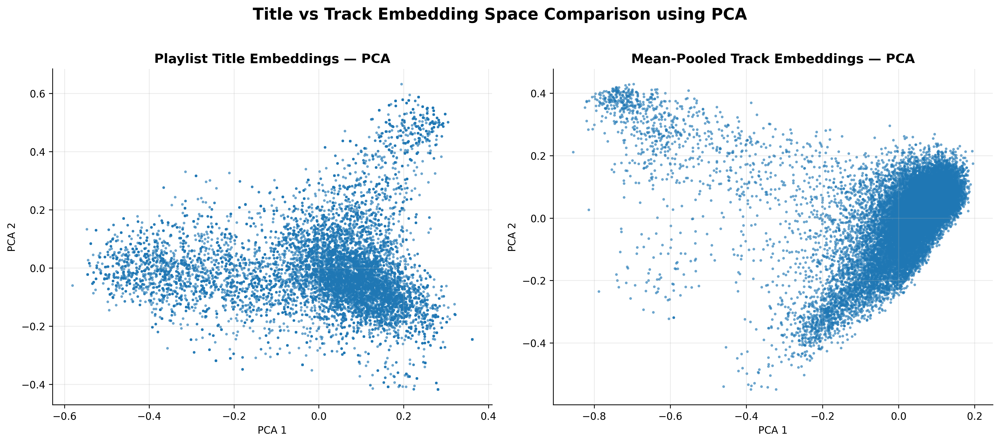

Saved: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/figures/tsne_title_vs_tracks_unclustered.png


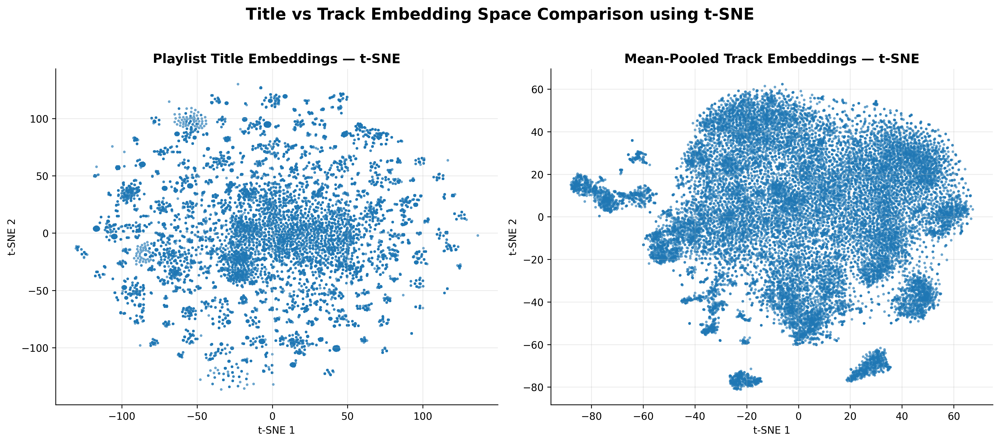

In [10]:
plot_pair(
    title_pca2,
    track_pca2,
    method_name="PCA",
    path=os.path.join(FIG_DIR, "pca_title_vs_tracks_unclustered.png"),
)

plot_pair(
    title_tsne2,
    track_tsne2,
    method_name="t-SNE",
    path=os.path.join(FIG_DIR, "tsne_title_vs_tracks_unclustered.png"),
)

## 9. Matched title-vs-track embedding similarity check

This compares each playlist's title embedding to its own track embedding, then compares that against random mismatched pairs. It is a useful sanity check before clustering.

,pair_type,mean,median,std
0,matched title-track,0.436389,0.434056,0.090208
1,random mismatched,0.399266,0.405713,0.081724


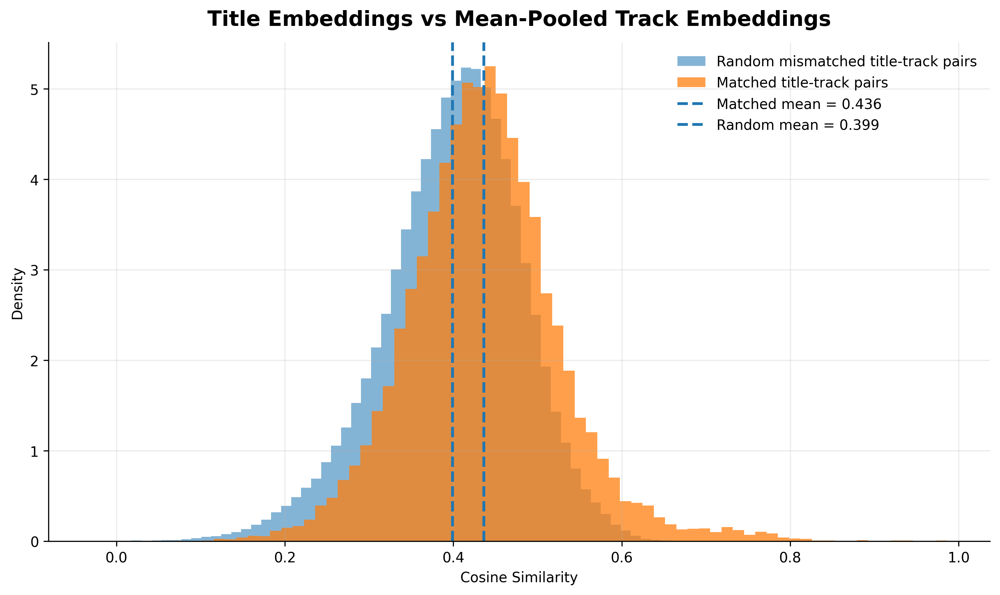

In [11]:
def cosine_matched_and_random(A, B, n_random_trials=10):
    # Inputs are already L2-normalized.
    matched = np.sum(A * B, axis=1)
    random_scores = []
    rng = np.random.default_rng(RANDOM_SEED)
    for _ in range(n_random_trials):
        perm = rng.permutation(len(B))
        random_scores.append(np.sum(A * B[perm], axis=1))
    random_scores = np.concatenate(random_scores)
    return matched, random_scores

matched_cos, random_cos = cosine_matched_and_random(title_X, track_X)

similarity_summary = pd.DataFrame([
    {"pair_type": "matched title-track", "mean": matched_cos.mean(), "median": np.median(matched_cos), "std": matched_cos.std()},
    {"pair_type": "random mismatched", "mean": random_cos.mean(), "median": np.median(random_cos), "std": random_cos.std()},
])

display(similarity_summary)
similarity_summary.to_csv(os.path.join(TABLE_DIR, "title_track_cosine_summary.csv"), index=False)

fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
ax.hist(random_cos, bins=70, density=True, alpha=0.55, label="Random mismatched title-track pairs")
ax.hist(matched_cos, bins=70, density=True, alpha=0.75, label="Matched title-track pairs")
ax.axvline(matched_cos.mean(), linestyle="--", linewidth=2, label=f"Matched mean = {matched_cos.mean():.3f}")
ax.axvline(random_cos.mean(), linestyle="--", linewidth=2, label=f"Random mean = {random_cos.mean():.3f}")
ax.set_title("Title Embeddings vs Mean-Pooled Track Embeddings", fontsize=15, fontweight="bold", pad=12)
ax.set_xlabel("Cosine Similarity")
ax.set_ylabel("Density")
ax.grid(True, alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(frameon=False)
plt.tight_layout()
fig.savefig(os.path.join(FIG_DIR, "title_track_cosine_matched_vs_random.png"), dpi=300, bbox_inches="tight")
plt.show()

## 10. Choose and run hard clustering baselines

We use `MAIN_K = 50` to match the teammate fuzzy clustering setup. The optional silhouette sweep helps justify whether 50 is reasonable on the sampled data.

Loading cached: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/cache/title_pca50_kmeans_k50_seed42.npz
Loading cached: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/cache/track_pca50_kmeans_k50_seed42.npz
Loading cached: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/cache/title_pca50_silhouette_sweep_seed42.csv
Loading cached: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/cache/track_pca50_silhouette_sweep_seed42.csv


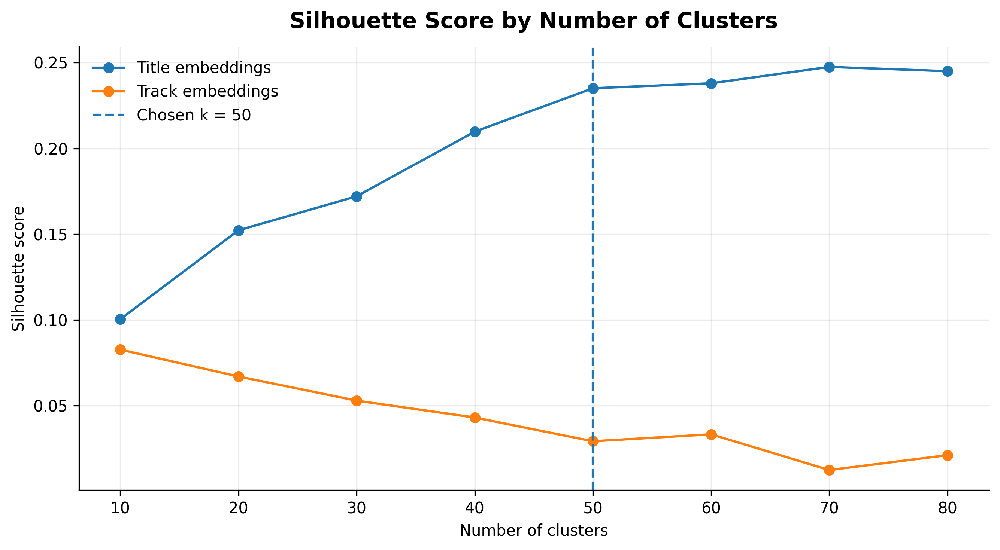

In [16]:
def kmeans_cached(X, name, k=MAIN_K, force=False):
    path = os.path.join(CACHE_DIR, f"{name}_kmeans_k{k}_seed{RANDOM_SEED}.npz")

    def _compute():
        if len(X) > 10_000:
            model = MiniBatchKMeans(n_clusters=k, random_state=RANDOM_SEED, batch_size=4096, n_init=20)
        else:
            model = KMeans(n_clusters=k, random_state=RANDOM_SEED, n_init=20)
        labels = model.fit_predict(X)
        return {"labels": labels.astype(np.int32), "centers": model.cluster_centers_.astype(np.float32)}

    return cache_npz(path, _compute, force=force)["labels"]


def silhouette_sweep(X, name, k_values=K_CANDIDATES):
    path = os.path.join(CACHE_DIR, f"{name}_silhouette_sweep_seed{RANDOM_SEED}.csv")
    if os.path.exists(path) and not FORCE_RECOMPUTE:
        print("Loading cached:", path)
        return pd.read_csv(path)

    rows = []
    rng = np.random.default_rng(RANDOM_SEED)
    score_idx = rng.choice(len(X), size=min(VALIDATION_SAMPLE_SIZE, len(X)), replace=False)

    for k in k_values:
        labels = kmeans_cached(X, f"{name}_sweep", k=k, force=False)
        score = silhouette_score(X[score_idx], labels[score_idx])
        rows.append({"k": k, "silhouette": score})
        print(name, "k=", k, "silhouette=", round(score, 4))

    out = pd.DataFrame(rows)
    out.to_csv(path, index=False)
    return out

# Cluster in PCA50 space, not directly in t-SNE space.
title_labels_high = kmeans_cached(title_pca50, "title_pca50", MAIN_K)
track_labels_high = kmeans_cached(track_pca50, "track_pca50", MAIN_K)

# Optional k sweep. Since cached, it will not rerun unless missing or FORCE_RECOMPUTE=True.
title_k_sweep = silhouette_sweep(title_pca50, "title_pca50")
track_k_sweep = silhouette_sweep(track_pca50, "track_pca50")

fig, ax = plt.subplots(figsize=(9, 5), dpi=300)
ax.plot(title_k_sweep["k"], title_k_sweep["silhouette"], marker="o", label="Title embeddings")
ax.plot(track_k_sweep["k"], track_k_sweep["silhouette"], marker="o", label="Track embeddings")
ax.axvline(MAIN_K, linestyle="--", linewidth=1.5, label=f"Chosen k = {MAIN_K}")
ax.set_title("Silhouette Score by Number of Clusters", fontsize=14, fontweight="bold", pad=12)
ax.set_xlabel("Number of clusters")
ax.set_ylabel("Silhouette score")
ax.grid(True, alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(frameon=False)
plt.tight_layout()
fig.savefig(os.path.join(FIG_DIR, "silhouette_by_k_title_vs_tracks.png"), dpi=300, bbox_inches="tight")
plt.show()

## 11. Cluster-colored PCA and t-SNE visuals

Clusters are computed in PCA50 space and then shown on PCA2/t-SNE2. This is the cleaner **cluster first, then dimension reduce for visualization** workflow.

/tmp/ipykernel_9262/1254816775.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/figures/pca_title_vs_tracks_cluster_colored.png


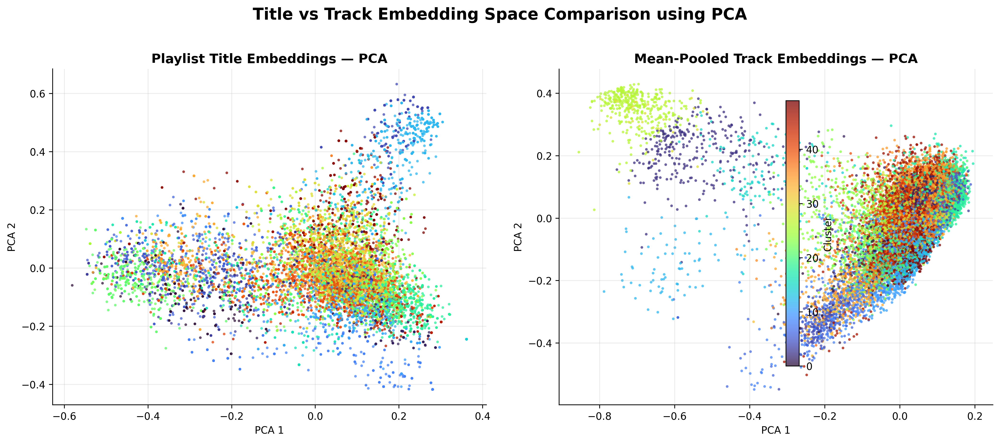

Saved: /content/drive/MyDrive/Math 250 Project - Spotify/analysis_outputs/title_track_cluster_extension/figures/tsne_title_vs_tracks_cluster_colored.png


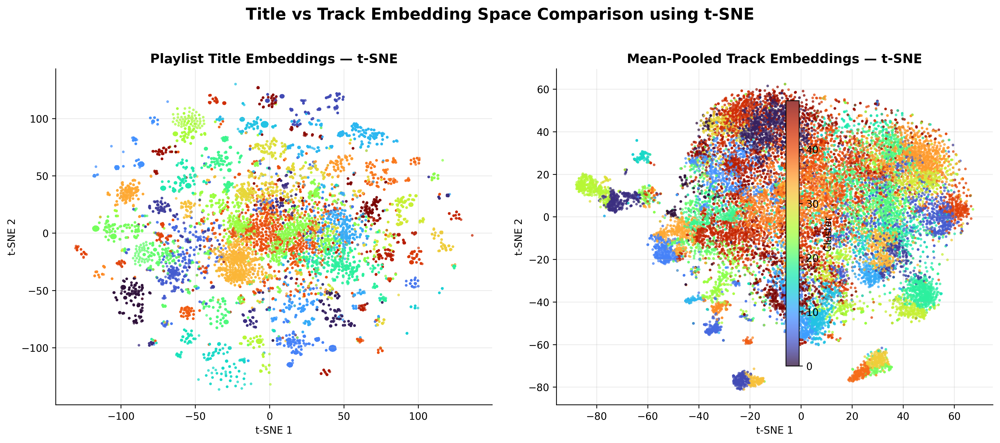

In [13]:
plot_pair(
    title_pca2,
    track_pca2,
    labels_a=title_labels_high,
    labels_b=track_labels_high,
    method_name="PCA",
    path=os.path.join(FIG_DIR, "pca_title_vs_tracks_cluster_colored.png"),
)

plot_pair(
    title_tsne2,
    track_tsne2,
    labels_a=title_labels_high,
    labels_b=track_labels_high,
    method_name="t-SNE",
    path=os.path.join(FIG_DIR, "tsne_title_vs_tracks_cluster_colored.png"),
)

## 12. Load existing fuzzy clustering results and compute distributional agreement

This reuses teammate outputs when available:

- `fkmeans_title_clusters.pkl`
- `fkmeans_tracks_clusters.pkl`

If those files are not found, the notebook does not rerun the full 1M-row fuzzy clustering unless `RUN_FUZZY_IF_MISSING = True`.

In [17]:
def load_probability_matrix(path, preferred_col=None, sample_positions=None):
    # Load probability vectors from teammate pkl/csv outputs, optionally subsetting by row position.
    if path is None or not os.path.exists(path):
        return None

    if path.endswith(".pkl"):
        obj = pd.read_pickle(path)
    elif path.endswith(".csv"):
        obj = pd.read_csv(path)
    else:
        with open(path, "rb") as f:
            obj = pickle.load(f)

    if isinstance(obj, pd.DataFrame):
        sub = obj.iloc[sample_positions].copy() if sample_positions is not None and len(obj) > np.max(sample_positions) else obj.copy()

        if preferred_col and preferred_col in sub.columns:
            P = np.vstack(sub[preferred_col].values)
        else:
            prob_cols = [c for c in sub.columns if c.startswith("cluster_")]
            if prob_cols:
                P = sub[prob_cols].to_numpy()
            else:
                possible = [c for c in sub.columns if "prob" in c or "membership" in c]
                if not possible:
                    raise ValueError(f"Could not identify probability column in {path}. Columns: {sub.columns.tolist()}")
                P = np.vstack(sub[possible[0]].values)
    else:
        P = np.asarray(obj)
        if sample_positions is not None and len(P) > np.max(sample_positions):
            P = P[sample_positions]

    P = np.asarray(P, dtype=np.float32)
    P = np.clip(P, 1e-12, 1.0)
    P = P / np.sum(P, axis=1, keepdims=True)
    return P


def run_fuzzy_cmeans_sample(X, k=MAIN_K, name="sample"):
    import skfuzzy as fuzz
    print(f"Running fuzzy c-means on sample for {name}. This is a fallback, not the full teammate run.")
    cntr, u, u0, d, jm, p, fpc = fuzz.cmeans(X.T, c=k, m=2, error=0.005, maxiter=1000, seed=RANDOM_SEED)
    P = u.T.astype(np.float32)
    P = np.clip(P, 1e-12, 1.0)
    P = P / P.sum(axis=1, keepdims=True)
    return P, {"fpc": float(fpc), "iterations": int(p)}

P_title = load_probability_matrix(FUZZY_TITLE_PKL, preferred_col="title_cluster_probs", sample_positions=valid_idx)
P_track = load_probability_matrix(FUZZY_TRACK_PKL, preferred_col="tracks_cluster_probs", sample_positions=valid_idx)

fuzzy_meta = {}
if P_title is None or P_track is None:
    print("Existing fuzzy probability files were not both found.")
    if RUN_FUZZY_IF_MISSING:
        P_title, fuzzy_meta_title = run_fuzzy_cmeans_sample(title_pca50, MAIN_K, "title")
        P_track, fuzzy_meta_track = run_fuzzy_cmeans_sample(track_pca50, MAIN_K, "track")
        fuzzy_meta = {"title": fuzzy_meta_title, "track": fuzzy_meta_track}
    else:
        print("Skipping fuzzy/PD sections that require probability matrices. Set RUN_FUZZY_IF_MISSING=True to run sample fuzzy clustering.")
else:
    print("Loaded fuzzy probability matrices:", P_title.shape, P_track.shape)

if P_title is not None and P_track is not None:
    fuzzy_title_labels = np.argmax(P_title, axis=1)
    fuzzy_track_labels = np.argmax(P_track, axis=1)

    # Distributional divergences.
    eps = 1e-12
    P = np.clip(P_title, eps, 1.0)
    Q = np.clip(P_track, eps, 1.0)
    P = P / P.sum(axis=1, keepdims=True)
    Q = Q / Q.sum(axis=1, keepdims=True)
    M = 0.5 * (P + Q)

    kl_title_to_track = entropy(P, Q, axis=1)
    kl_track_to_title = entropy(Q, P, axis=1)
    sym_kl = 0.5 * (kl_title_to_track + kl_track_to_title)
    js = 0.5 * entropy(P, M, axis=1) + 0.5 * entropy(Q, M, axis=1)
    hellinger = np.sqrt(0.5 * np.sum((np.sqrt(P) - np.sqrt(Q)) ** 2, axis=1))

    fuzzy_agreement_df = pd.DataFrame({
        "row_index": valid_idx,
        "playlist_title": sample_titles,
        "title_hard_cluster": fuzzy_title_labels,
        "track_hard_cluster": fuzzy_track_labels,
        "kl_title_to_track": kl_title_to_track,
        "kl_track_to_title": kl_track_to_title,
        "symmetric_kl": sym_kl,
        "js_divergence": js,
        "hellinger_distance": hellinger,
    })

    fuzzy_summary = fuzzy_agreement_df[["kl_title_to_track", "kl_track_to_title", "symmetric_kl", "js_divergence", "hellinger_distance"]].agg(
        ["mean", "median", "std", "min", "max"]
    ).T.reset_index().rename(columns={"index": "metric"})

    print("Fuzzy hard-label ARI, title vs track:", adjusted_rand_score(fuzzy_title_labels, fuzzy_track_labels))
    display(fuzzy_summary)

    fuzzy_agreement_df.to_csv(os.path.join(TABLE_DIR, "fuzzy_distribution_agreement_sample.csv"), index=False)
    fuzzy_summary.to_csv(os.path.join(TABLE_DIR, "fuzzy_distribution_agreement_summary.csv"), index=False)
else:
    fuzzy_agreement_df = None
    fuzzy_summary = None

NameError: name 'FUZZY_TRACK_PKL' is not defined

## 13. PD clustering: clustering the fuzzy membership probability distributions

Here **PD clustering** means clustering playlists based on their fuzzy membership probability distributions. This extends fuzzy clustering because each playlist is represented not just by an embedding, but by the relationship between its title-cluster distribution and track-cluster distribution.

Feature vector used for PD clustering:

`[title_probs, track_probs, abs(title_probs - track_probs), average_probs]`

Then we summarize each PD cluster by JS divergence, symmetric KL, Hellinger distance, and example playlist titles.

In [ ]:
if P_title is not None and P_track is not None:
    PD_K = 8

    pd_features = np.hstack([
        P_title,
        P_track,
        np.abs(P_title - P_track),
        0.5 * (P_title + P_track),
    ]).astype(np.float32)

    pd_labels = kmeans_cached(pd_features, "pd_probability_features", k=PD_K, force=FORCE_RECOMPUTE)
    fuzzy_agreement_df["pd_cluster"] = pd_labels

    def example_titles(series, max_examples=5):
        vals = [str(x) for x in series.head(max_examples).values]
        return "; ".join(vals)

    pd_summary = fuzzy_agreement_df.groupby("pd_cluster").agg(
        playlist_count=("playlist_title", "count"),
        mean_js=("js_divergence", "mean"),
        median_js=("js_divergence", "median"),
        mean_symmetric_kl=("symmetric_kl", "mean"),
        median_symmetric_kl=("symmetric_kl", "median"),
        mean_hellinger=("hellinger_distance", "mean"),
        example_titles=("playlist_title", example_titles),
    ).reset_index().sort_values("median_js")

    display(pd_summary)
    pd_summary.to_csv(os.path.join(TABLE_DIR, "pd_cluster_summary.csv"), index=False)
    save_df_table_image(
        pd_summary,
        os.path.join(FIG_DIR, "pd_cluster_summary_table.png"),
        title="PD Cluster Summary: Fuzzy Title-vs-Track Distribution Agreement",
        max_rows=PD_K,
    )

    fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
    ax.bar(pd_summary["pd_cluster"].astype(str), pd_summary["median_js"])
    ax.set_title("Median JS Divergence by PD Cluster", fontsize=14, fontweight="bold", pad=12)
    ax.set_xlabel("PD cluster")
    ax.set_ylabel("Median JS divergence")
    ax.grid(axis="y", alpha=0.25)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    plt.tight_layout()
    fig.savefig(os.path.join(FIG_DIR, "pd_cluster_median_js.png"), dpi=300, bbox_inches="tight")
    plt.show()

    # Visualize PD clusters on the track t-SNE because track embeddings represent song-content space.
    plot_report_scatter(
        track_tsne2,
        labels=pd_labels,
        title="PD Clusters Displayed on Track-Embedding t-SNE",
        xlabel="t-SNE 1",
        ylabel="t-SNE 2",
        path=os.path.join(FIG_DIR, "pd_clusters_on_track_tsne.png"),
        caption="PD clusters are computed from fuzzy title-vs-track membership distributions, then visualized on track t-SNE coordinates.",
    )
else:
    print("PD clustering skipped because fuzzy probability matrices are unavailable.")
    pd_summary = None
    pd_labels = None

## 14. Clustering validation tables

Metrics included:

- **Silhouette score**: higher is better.
- **Davies-Bouldin index**: lower is better.
- **Calinski-Harabasz index**: higher is better.
- Cluster counts and size summaries.

In [ ]:
def validate_clustering(X, labels, name, sample_size=VALIDATION_SAMPLE_SIZE):
    labels = np.asarray(labels)
    non_noise = labels != -1
    labels_eval = labels[non_noise]
    X_eval = X[non_noise]

    n_clusters = len(np.unique(labels_eval))
    n_noise = int(np.sum(~non_noise))

    row = {
        "solution": name,
        "n_points": int(len(labels)),
        "n_clusters": int(n_clusters),
        "noise_points": n_noise,
        "noise_pct": n_noise / len(labels),
    }

    if n_clusters < 2 or len(X_eval) <= n_clusters:
        row.update({"silhouette": np.nan, "davies_bouldin": np.nan, "calinski_harabasz": np.nan})
    else:
        rng = np.random.default_rng(RANDOM_SEED)
        eval_idx = rng.choice(len(X_eval), size=min(sample_size, len(X_eval)), replace=False)
        try:
            row["silhouette"] = silhouette_score(X_eval[eval_idx], labels_eval[eval_idx])
        except Exception:
            row["silhouette"] = np.nan
        try:
            row["davies_bouldin"] = davies_bouldin_score(X_eval[eval_idx], labels_eval[eval_idx])
        except Exception:
            row["davies_bouldin"] = np.nan
        try:
            row["calinski_harabasz"] = calinski_harabasz_score(X_eval[eval_idx], labels_eval[eval_idx])
        except Exception:
            row["calinski_harabasz"] = np.nan

    sizes = pd.Series(labels_eval).value_counts()
    row["min_cluster_size"] = int(sizes.min()) if len(sizes) else 0
    row["median_cluster_size"] = float(sizes.median()) if len(sizes) else 0
    row["max_cluster_size"] = int(sizes.max()) if len(sizes) else 0
    return row

validation_rows = []
validation_rows.append(validate_clustering(title_pca50, title_labels_high, "Title KMeans on PCA50"))
validation_rows.append(validate_clustering(track_pca50, track_labels_high, "Track KMeans on PCA50"))

if P_title is not None and P_track is not None:
    validation_rows.append(validate_clustering(title_pca50, fuzzy_title_labels, "Title fuzzy c-means hard labels"))
    validation_rows.append(validate_clustering(track_pca50, fuzzy_track_labels, "Track fuzzy c-means hard labels"))
if pd_labels is not None:
    validation_rows.append(validate_clustering(pd_features, pd_labels, "PD clusters on fuzzy probability features"))

validation_df = pd.DataFrame(validation_rows)
validation_df_rounded = validation_df.copy()
for c in ["noise_pct", "silhouette", "davies_bouldin", "calinski_harabasz"]:
    if c in validation_df_rounded.columns:
        validation_df_rounded[c] = validation_df_rounded[c].astype(float).round(4)

display(validation_df_rounded)
validation_df_rounded.to_csv(os.path.join(TABLE_DIR, "clustering_validation_summary.csv"), index=False)
save_df_table_image(
    validation_df_rounded,
    os.path.join(FIG_DIR, "clustering_validation_summary_table.png"),
    title="Clustering Validation Summary",
    max_rows=20,
)

fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
plot_df = validation_df_rounded.dropna(subset=["silhouette"])
ax.barh(plot_df["solution"], plot_df["silhouette"])
ax.set_title("Silhouette Score by Clustering Solution", fontsize=14, fontweight="bold", pad=12)
ax.set_xlabel("Silhouette score")
ax.grid(axis="x", alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.tight_layout()
fig.savefig(os.path.join(FIG_DIR, "validation_silhouette_bar.png"), dpi=300, bbox_inches="tight")
plt.show()

## 15. Cluster-first vs reduce-first comparison using ARI

This directly answers the workflow comparison request:

1. **Cluster first, then dimension reduce**: cluster in PCA50 space, then show labels in PCA2/t-SNE2.
2. **Dimension reduce first, then cluster**: reduce to PCA2 or t-SNE2 first, then cluster in 2D.

ARI compares whether the same playlists end up grouped similarly. ARI near 1 means strong agreement; ARI near 0 means agreement close to random.

In [ ]:
# Dimension-reduce first, then cluster.
title_labels_pca2 = kmeans_cached(title_pca2, "title_pca2_reduce_first", MAIN_K)
track_labels_pca2 = kmeans_cached(track_pca2, "track_pca2_reduce_first", MAIN_K)

title_labels_tsne2 = kmeans_cached(title_tsne2, "title_tsne2_reduce_first", MAIN_K)
track_labels_tsne2 = kmeans_cached(track_tsne2, "track_tsne2_reduce_first", MAIN_K)

ari_rows = []

def add_ari(embedding, comparison, labels_a, labels_b):
    ari_rows.append({
        "embedding_space": embedding,
        "comparison": comparison,
        "ARI": adjusted_rand_score(labels_a, labels_b),
        "NMI": normalized_mutual_info_score(labels_a, labels_b),
        "AMI": adjusted_mutual_info_score(labels_a, labels_b),
    })

# Within each embedding type: does reduce-first reproduce cluster-first?
add_ari("Title", "Cluster PCA50 vs cluster PCA2", title_labels_high, title_labels_pca2)
add_ari("Title", "Cluster PCA50 vs cluster t-SNE2", title_labels_high, title_labels_tsne2)
add_ari("Track", "Cluster PCA50 vs cluster PCA2", track_labels_high, track_labels_pca2)
add_ari("Track", "Cluster PCA50 vs cluster t-SNE2", track_labels_high, track_labels_tsne2)

# Across embedding types: do title clusters match track clusters under each workflow?
add_ari("Title vs Track", "PCA50 cluster labels", title_labels_high, track_labels_high)
add_ari("Title vs Track", "PCA2 reduce-first cluster labels", title_labels_pca2, track_labels_pca2)
add_ari("Title vs Track", "t-SNE2 reduce-first cluster labels", title_labels_tsne2, track_labels_tsne2)

if P_title is not None and P_track is not None:
    add_ari("Title vs Track", "Fuzzy hard labels", fuzzy_title_labels, fuzzy_track_labels)
    add_ari("Title", "KMeans PCA50 vs fuzzy hard labels", title_labels_high, fuzzy_title_labels)
    add_ari("Track", "KMeans PCA50 vs fuzzy hard labels", track_labels_high, fuzzy_track_labels)

ari_df = pd.DataFrame(ari_rows)
ari_df_rounded = ari_df.copy()
for c in ["ARI", "NMI", "AMI"]:
    ari_df_rounded[c] = ari_df_rounded[c].round(4)

display(ari_df_rounded)
ari_df_rounded.to_csv(os.path.join(TABLE_DIR, "ari_workflow_comparison.csv"), index=False)
save_df_table_image(
    ari_df_rounded,
    os.path.join(FIG_DIR, "ari_workflow_comparison_table.png"),
    title="ARI/NMI/AMI Workflow Comparison",
    max_rows=20,
)

fig, ax = plt.subplots(figsize=(11, 6), dpi=300)
labels_for_plot = ari_df_rounded["embedding_space"] + " — " + ari_df_rounded["comparison"]
ax.barh(labels_for_plot, ari_df_rounded["ARI"])
ax.set_title("Adjusted Rand Index: Cluster-First vs Reduce-First Comparisons", fontsize=14, fontweight="bold", pad=12)
ax.set_xlabel("ARI")
ax.grid(axis="x", alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.tight_layout()
fig.savefig(os.path.join(FIG_DIR, "ari_workflow_comparison_bar.png"), dpi=300, bbox_inches="tight")
plt.show()

## 16. Visual comparison: reduce-first cluster labels

These plots show what happens if clustering is performed after reducing to 2D. Compare these to the earlier cluster-colored plots where labels were computed in PCA50 space.

In [ ]:
plot_pair(
    title_pca2,
    track_pca2,
    labels_a=title_labels_pca2,
    labels_b=track_labels_pca2,
    method_name="PCA",
    path=os.path.join(FIG_DIR, "pca_title_vs_tracks_reduce_first_clusters.png"),
)

plot_pair(
    title_tsne2,
    track_tsne2,
    labels_a=title_labels_tsne2,
    labels_b=track_labels_tsne2,
    method_name="t-SNE",
    path=os.path.join(FIG_DIR, "tsne_title_vs_tracks_reduce_first_clusters.png"),
)

## 17. Export a compact report index

This creates a small JSON file listing the main output files produced by the notebook.

In [ ]:
report_index = {
    "analysis_dir": ANALYSIS_DIR,
    "figures_dir": FIG_DIR,
    "tables_dir": TABLE_DIR,
    "cache_dir": CACHE_DIR,
    "key_figures": sorted([str(p) for p in Path(FIG_DIR).glob("*.png")]),
    "key_tables": sorted([str(p) for p in Path(TABLE_DIR).glob("*.csv")]),
    "sample_size_actual": int(len(valid_idx)),
    "main_k": int(MAIN_K),
    "pca_explained_variance": {
        "title_2_pc": float(title_pca["explained_2"][0]),
        "title_50_pc": float(title_pca["explained_50"][0]),
        "track_2_pc": float(track_pca["explained_2"][0]),
        "track_50_pc": float(track_pca["explained_50"][0]),
    },
}

report_index_path = os.path.join(ANALYSIS_DIR, "report_index.json")
save_json(report_index, report_index_path)
print("Wrote report index:", report_index_path)
print("Main figures:")
for p in report_index["key_figures"]:
    print(" -", p)
print("Main tables:")
for p in report_index["key_tables"]:
    print(" -", p)

## 18. Suggested report interpretation language

Use this after reviewing the actual metric values from your run.

> We compared playlist title embeddings with mean-pooled track embeddings using both PCA and t-SNE visualizations. Clusters were primarily computed in PCA50 space and visualized in 2D to avoid over-interpreting t-SNE geometry. We also compared this with a reduce-first workflow by clustering directly on PCA2 and t-SNE2 coordinates. ARI was used to measure whether the two workflows produced similar groupings.
>
> To extend the fuzzy clustering work, we treated each fuzzy membership vector as a probability distribution and compared title-based and track-based membership distributions using KL divergence, symmetric KL, JS divergence, and Hellinger distance. We then performed PD clustering on these distributional features to identify groups of playlists where title-based and track-based cluster memberships align differently.
>
> The validation table reports internal clustering metrics including silhouette score, Davies-Bouldin index, and Calinski-Harabasz index. Higher silhouette and Calinski-Harabasz values, together with lower Davies-Bouldin values, indicate cleaner clustering structure.